In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="0"

In [2]:
!nvidia-smi

Wed Feb 12 10:44:37 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.86.15              Driver Version: 570.86.15      CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100 80GB PCIe          On  |   00000000:17:00.0 Off |                    0 |
| N/A   32C    P0             53W /  300W |       1MiB /  81920MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [3]:
from transformers import Qwen2_5_VLForConditionalGeneration, AutoTokenizer, AutoProcessor, AutoModel 
from qwen_vl_utils import process_vision_info

import torch
import json
import random
import io
import ast
from PIL import Image, ImageDraw, ImageFont
from PIL import ImageColor

import Levenshtein
import cv2
import numpy as np
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt

/gpfs/projects/CascanteBonillaGroup/jmurrugarral/anaconda3/envs/py10-QWEN/lib/python3.10/site-packages/transformers/utils/hub.py:127: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(


In [4]:


# default: Load the model on the available device(s)
model = Qwen2_5_VLForConditionalGeneration.from_pretrained(
    "Qwen/Qwen2.5-VL-7B-Instruct", torch_dtype="auto", device_map="auto"
)

# default processer
processor = AutoProcessor.from_pretrained("Qwen/Qwen2.5-VL-7B-Instruct")


Loading checkpoint shards:   0%|          | 0/5 [00:00<?, ?it/s]

In [5]:

def plot_bounding_boxes(im, bounding_boxes, input_width, input_height, json=False):
    """
    Plots bounding boxes on an image with markers for each a name, using PIL, normalized coordinates, and different colors.

    Args:
        img_path: The path to the image file.
        bounding_boxes: A list of bounding boxes containing the name of the object
         and their positions in normalized [y1 x1 y2 x2] format.
    """

    # Load the image
    img = im
    width, height = img.size
    print(img.size)
    # Create a drawing object
    draw = ImageDraw.Draw(img)

    # Define a list of colors
    colors = [
    'red',
    'green',
    'blue',
    'yellow',
    'orange',
    'pink',
    'purple',
    'brown',
    'gray',
    'beige',
    'turquoise',
    'cyan',
    'magenta',
    'lime',
    'navy',
    'maroon',
    'teal',
    'olive',
    'coral',
    'lavender',
    'violet',
    'gold',
    'silver',
    ] + additional_colors

    if json == False:
        
        # Parsing out the markdown fencing
        bounding_boxes = parse_json(bounding_boxes)

        #font = ImageFont.truetype("NotoSansCJK-Regular.ttc", size=14)

        try:
          json_output = ast.literal_eval(bounding_boxes)
        except Exception as e:
          end_idx = bounding_boxes.rfind('"}') + len('"}')
          truncated_text = bounding_boxes[:end_idx] + "]"
          json_output = ast.literal_eval(truncated_text)
    else:
        #json_output = ast.literal_eval(bounding_boxes)
        json_output = bounding_boxes
    print(json_output)

    # Iterate over the bounding boxes
    for i, bounding_box in enumerate(json_output):
      # Select a color from the list
      color = colors[i % len(colors)]

      # Convert normalized coordinates to absolute coordinates
      abs_y1 = int(bounding_box["bbox_2d"][1]/input_height * height)
      abs_x1 = int(bounding_box["bbox_2d"][0]/input_width * width)
      abs_y2 = int(bounding_box["bbox_2d"][3]/input_height * height)
      abs_x2 = int(bounding_box["bbox_2d"][2]/input_width * width)

      if abs_x1 > abs_x2:
        abs_x1, abs_x2 = abs_x2, abs_x1

      if abs_y1 > abs_y2:
        abs_y1, abs_y2 = abs_y2, abs_y1

      # Draw the bounding box
      draw.rectangle(
          ((abs_x1, abs_y1), (abs_x2, abs_y2)), outline=color, width=4
      )

      # Draw the text
      if "label" in bounding_box:
        draw.text((abs_x1 + 8, abs_y1 + 6), bounding_box["label"], fill=color)#, font=font)

    # Display the image
    img.show()

    return img

# @title Parsing JSON output
def parse_json(json_output):
    # Parsing out the markdown fencing
    lines = json_output.splitlines()
    for i, line in enumerate(lines):
        if line == "```json":
            json_output = "\n".join(lines[i+1:])  # Remove everything before "```json"
            json_output = json_output.split("```")[0]  # Remove everything after the closing "```"
            break  # Exit the loop once "```json" is found
    return json_output

In [6]:
additional_colors = [colorname for (colorname, colorcode) in ImageColor.colormap.items()]
def locate_private_content(img_full_path, prompt, temperature = 1, top_p = 0.8, grounding = True):

    max_new_tokens=1024
    image = Image.open(img_full_path)
    messages = [
        {
            "role": "system",
            "content": "You are a helpful assistant"
        },
        {
            "role": "user",
            "content": [
                {
                    "type": "text",
                    "text": prompt
                },
                {
                  "image": img_full_path
                }
            ]
        }
    ]
    text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    print("input:\n",text)
    inputs = processor(text=[text], images=[image], padding=True, return_tensors="pt").to('cuda')

    output_ids = model.generate(**inputs, max_new_tokens=1024)#, temperature= temperature, top_p = top_p)
    generated_ids = [output_ids[len(input_ids):] for input_ids, output_ids in zip(inputs.input_ids, output_ids)]
    output_text = processor.batch_decode(generated_ids, skip_special_tokens=True, clean_up_tokenization_spaces=True)
    print("output:\n",output_text[0])

    input_height = inputs['image_grid_thw'][0][1]*14
    input_width = inputs['image_grid_thw'][0][2]*14

    print(input_height)
    print(input_width)
    
    response = output_text[0]

    if grounding == True:
        image = Image.open(img_full_path)
        image.thumbnail([1000,1000], Image.Resampling.LANCZOS)
        image = plot_bounding_boxes(image,response,input_width,input_height)
    else:
        image = None
    
    return response, image
    

[[522  10]
 [  2  29]
 [  3 719]
 [401 661]]
Homography Matrix:
[[ 1.74582167e+00 -2.53017633e-03 -3.41826823e+00]
 [ 3.92738458e-02  1.07486315e+00 -3.12495790e+01]
 [-1.69615276e-04 -3.58548411e-04  1.00000000e+00]]


True

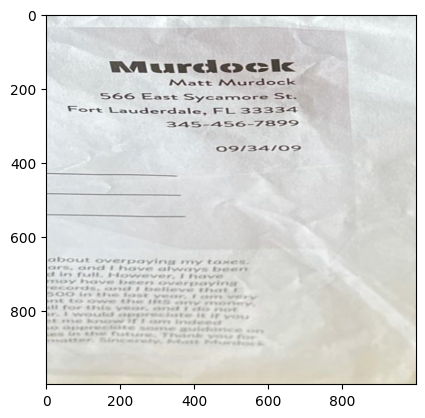

In [7]:
directory = "/gpfs/projects/CascanteBonillaGroup/jmurrugarral/DeepSeek-VL2"
filename = 'masked_image.jpg'
image_file = 'masked_image.jpg'

img_full_path = os.path.join(directory, filename)

raw_img = cv2.imread(img_full_path, cv2.IMREAD_COLOR)
img = cv2.imread(img_full_path, cv2.IMREAD_COLOR)
plt.imshow(raw_img)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
ret, thresh = cv2.threshold(gray, 127, 255, 0) 

# finding the contours 
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, 
                               cv2.CHAIN_APPROX_SIMPLE) 
  
# take the first contour 
cnt = contours[0] 

# computing the bounding rectangle of the contour 
x, y, w, h = cv2.boundingRect(cnt) 
  
# draw contour 
img = cv2.drawContours(img, [cnt], 0, (0, 255, 255), 2) 
  
# draw the bounding rectangle 
img = cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2) 

# Approximate the contour to a polygon (should be a quadrilateral)
epsilon = 0.02 * cv2.arcLength(cnt, True)
corners = cv2.approxPolyDP(cnt, epsilon, True)

# Draw the corners on the image
for corner in corners:
    cv2.circle(img, tuple(corner[0]), 10, (0, 0, 255), -1)

plt.imshow(img)

src_points = np.array(corners).reshape(-1,2)
print(src_points)

dst_points = np.array([
    [1000, 0],  
    [0, 0],
    [0, 1000],
    [1000, 1000]
], dtype=np.float32)


# Compute the homography matrix
H, status = cv2.findHomography(src_points, dst_points, cv2.RANSAC)

print("Homography Matrix:")
print(H)

# Warp the source image to align with the destination image
height, width, channels = (1000, 1000, 3)
warped_img = cv2.warpPerspective(raw_img, H, (width, height))

plt.imshow(warped_img)

cv2.imwrite('masked_himage.jpg', warped_img)

In [8]:
def get_pseudo_detections(image_file, img_full_path, threshold_conf):
    #ans, img = locate_private_content(img_full_path, "Spotting all the text in the image with line-level, and output in JSON format.", temperature = 1, top_p=0.8)#, show_results = False)
    #ans, img = locate_private_content(img_full_path, "Describe the text with labels, and output in JSON format", temperature = 1, top_p=0.8)#, show_results = False)
    
    ans, img = locate_private_content(img_full_path, "Detect all the text and provide a label in the image with line-level, and output in JSON format.", temperature = 1, top_p=0.8)#, show_results = False)
    
    return img

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Detect all the text and provide a label in the image with line-level, and output in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [169, 118, 678, 165], "text_content": "Murdock"},
	{"bbox_2d": [334, 170, 680, 202], "text_content": "Matt Murdock"},
	{"bbox_2d": [145, 211, 685, 239], "text_content": "566 East Sycamore St."},
	{"bbox_2d": [55, 246, 685, 275], "text_content": "Fort Lauderdale, FL 33334"},
	{"bbox_2d": [325, 282, 689, 312], "text_content": "345-456-7899"},
	{"bbox_2d": [461, 351, 695, 380], "text_content": "09/34/09"},
]
```
tensor(1008, device='cuda:0')
tensor(1008, device='cuda:0')
(1000, 1000)
[{'bbox_2d': [169, 118, 678, 165], 'text_content': 'Murdock'}, {'bbox_2d': [334, 170, 680, 202], 'text_content': 'Matt Murdock'}, {'bbox_2d': [145, 211, 685, 239], 'text_content': '566 East Sycamore St.'}, {'bbox_2d': [55, 246,

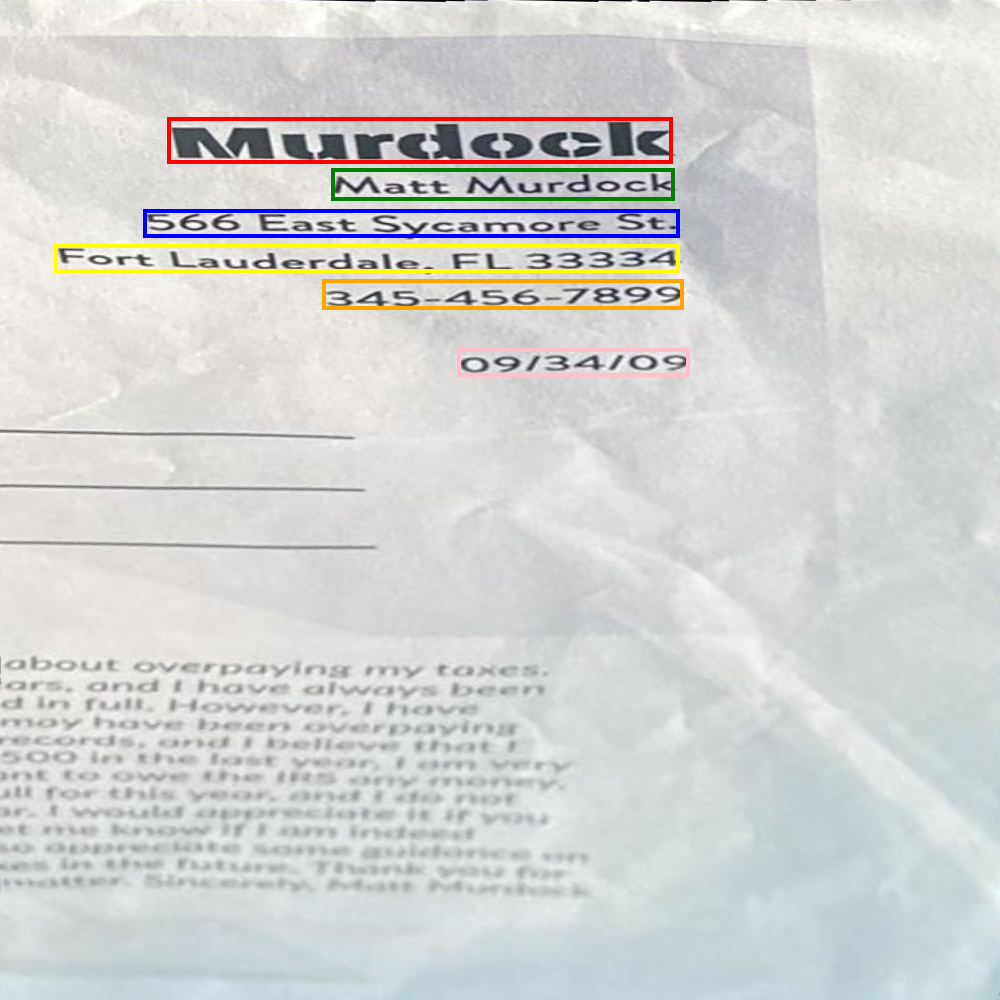

In [9]:
directory = "/gpfs/projects/CascanteBonillaGroup/jmurrugarral/DeepSeek-VL2"
filename = 'masked_himage.jpg'
image_file = 'masked_himage.jpg'

img_full_path = os.path.join(directory, filename)

get_pseudo_detections(image_file, img_full_path, 0.8);

In [10]:
def get_pseudo_detections2(image_file, img_full_path, threshold_conf):
    
    ans, img = locate_private_content(img_full_path, "Recognise all texts in the image, output in lines.", temperature = 1, top_p=0.8, grounding = False)#, show_results = False)

    queries = ans.split('\n')

    JSON = []
    
    for ind, query in enumerate(queries):
        
        g_ans, img = locate_private_content(img_full_path, "Locate where is '"+query+"' on the image, output the bbo coordinates in JSON format.", temperature = 1, top_p=0.8)#, show_results = False)
        
        image_file = 'image_ocr'+str(ind)+'.jpg'
        cv2.imwrite(image_file, np.array(img))
        test_image = cv2.imread(image_file)

        ans, img = locate_private_content(image_file, "Describe the text on the red bounding box, in JSON format", temperature = 1, top_p=0.8, grounding = False)

        #ans, img = locate_private_content(image_file, "Recognise the text on the red bounding box, in JSON format", temperature = 1, top_p=0.8, grounding = False)
        
        data = json.loads(parse_json(ans))

        g_data = json.loads(parse_json(g_ans))
    
        text = data['text'] 
    
        distance = Levenshtein.distance(query, text)

        sum_len = len(text) + len(query)
        confidence = ((sum_len-distance)/sum_len) * 100

        print(confidence)
        
        if confidence >= threshold_conf:
        
            JSON.append(g_data[0])

            #image = Image.open(img_full_path)
            #image.thumbnail([1000,1000], Image.Resampling.LANCZOS)
            #plot_bounding_boxes(image, JSON, torch.tensor(532, device='cuda:0'), torch.tensor(728, device='cuda:0'), json=True)
    
    image = Image.open(img_full_path)
    image.thumbnail([1000,1000], Image.Resampling.LANCZOS)
    plot_bounding_boxes(image, JSON, torch.tensor(532, device='cuda:0'), torch.tensor(728, device='cuda:0'), json=True)
    
    return img

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Recognise all texts in the image, output in lines.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 Murdock
Matt Murdock
566 East Sycamore St.
Fort Lauderdale, FL 33334
345-456-7899
09/34/09

about overpaying my taxes.
and I have always been
d in full. However, I have
move have been overpaying
records, and I believe that I
000 in the last year. I am very
ant to owe the IRS any money,
ll for this year, and I do not
t me know if I am indeed
so appreciate some guidance on
es in the future. Thank you for
matter. Sincerely, Matt Murdock
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'Murdock' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [91, 116, 350

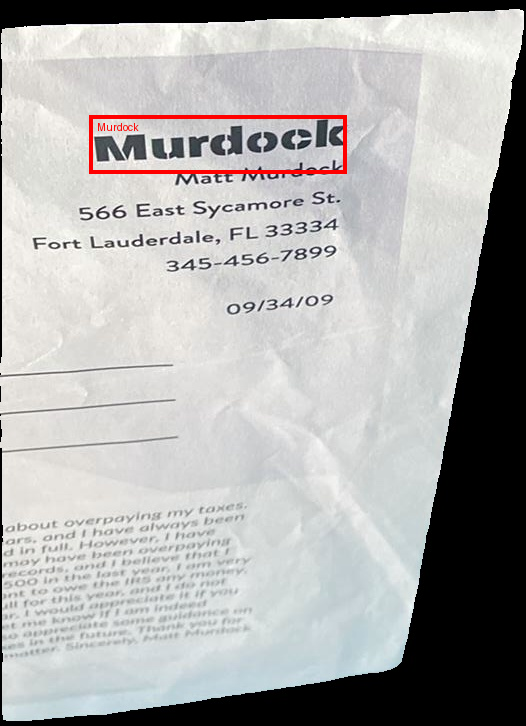

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "Murdoch"
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
92.85714285714286
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'Matt Murdock' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [176, 130, 348, 159], "label": "Matt Murdock"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [176, 130, 348, 159], 'label': 'Matt Murdock'}]


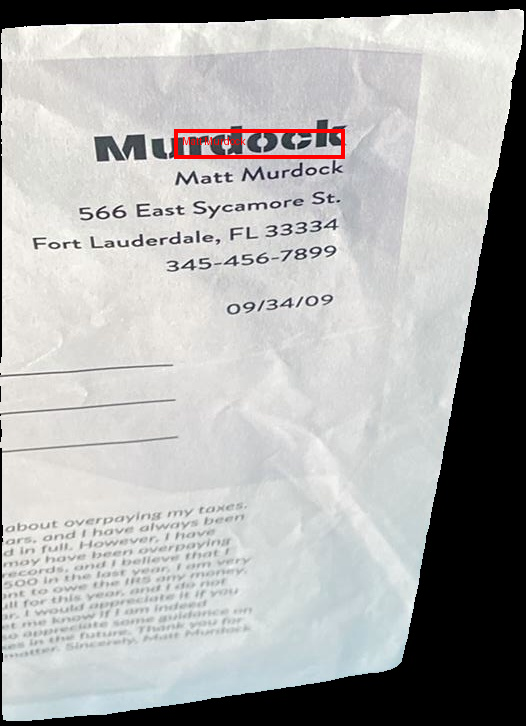

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "Matt Murdock"
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
100.0
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is '566 East Sycamore St.' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [78, 169, 320, 224], "label": "'566 East Sycamore St.'"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [78, 169, 320, 224], 'label': "'566 East Sycamore St.'"}]


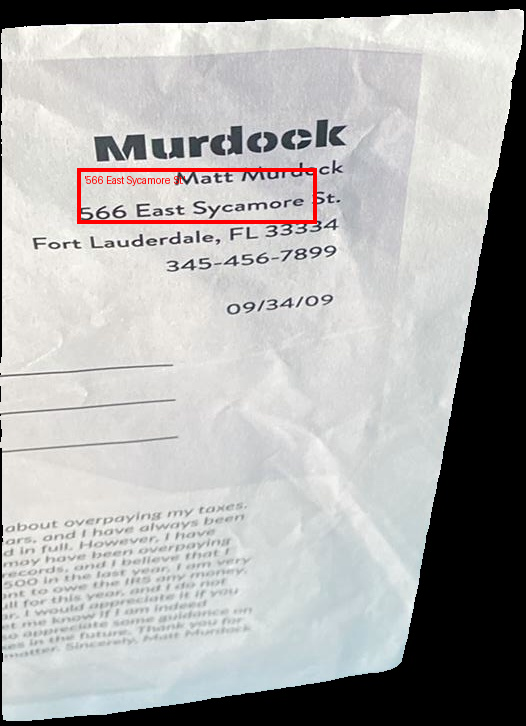

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "566 East Sycamore St."
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
100.0
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'Fort Lauderdale, FL 33334' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [58, 229, 337, 251], "label": "'Fort Lauderdale, FL 33334'"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [58, 229, 337, 251], 'label': "'Fort Lauderdale, FL 33334'"}]


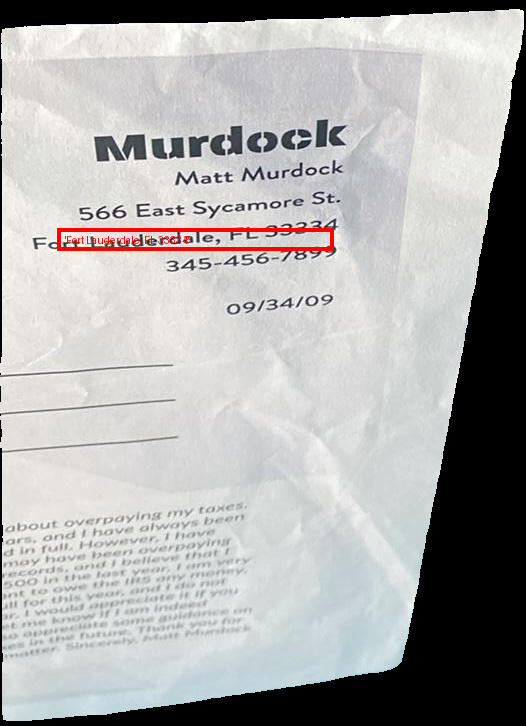

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "Matt Murdock"
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
45.94594594594595
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is '345-456-7899' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [167, 230, 342, 275], "label": "'345-456-7899'"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [167, 230, 342, 275], 'label': "'345-456-7899'"}]


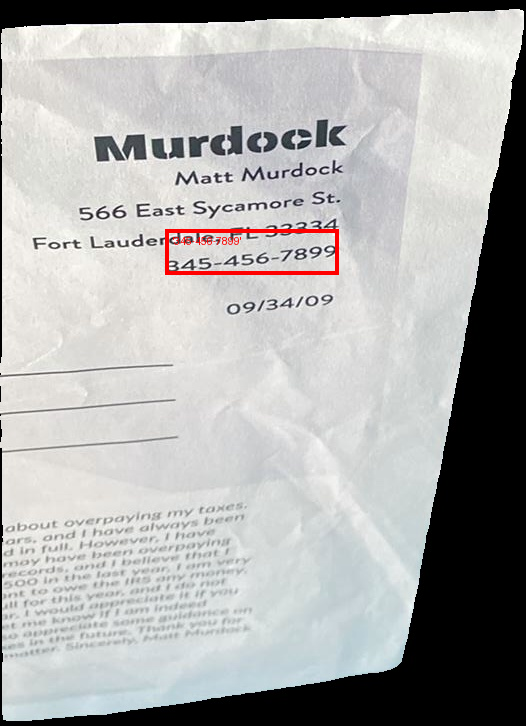

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "345-456-7899"
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
100.0
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is '09/34/09' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [228, 291, 337, 316], "label": "'09/34/09'"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [228, 291, 337, 316], 'label': "'09/34/09'"}]


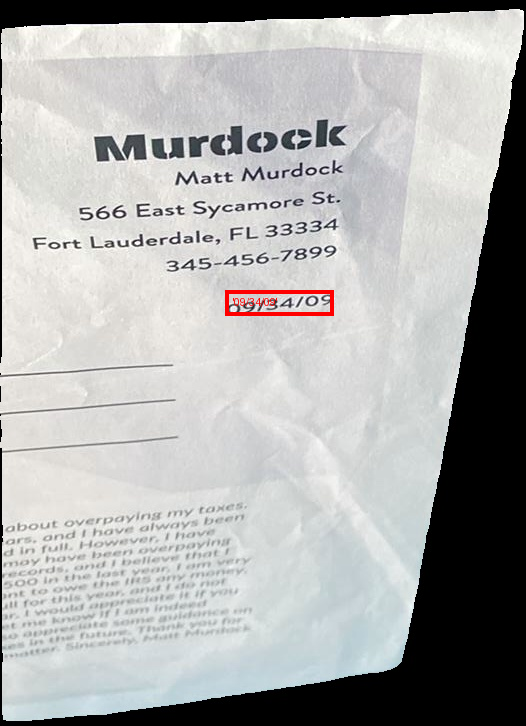

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "09/34/09"
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
100.0
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is '' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [198, 304, 206, 312], "label": "'"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [198, 304, 206, 312], 'label': "'"}]


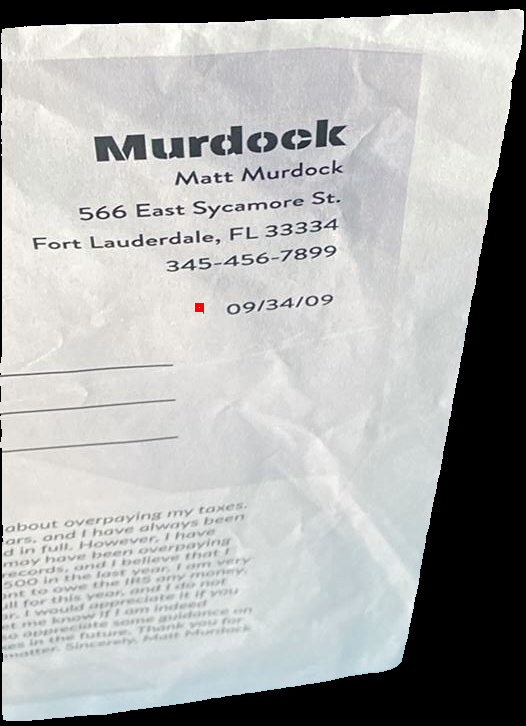

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "09/34/09"
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
0.0
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'about overpaying my taxes.' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [0, 528, 254, 561], "label": "about overpaying my taxes."}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [0, 528, 254, 561], 'label': 'about overpaying my taxes.'}]


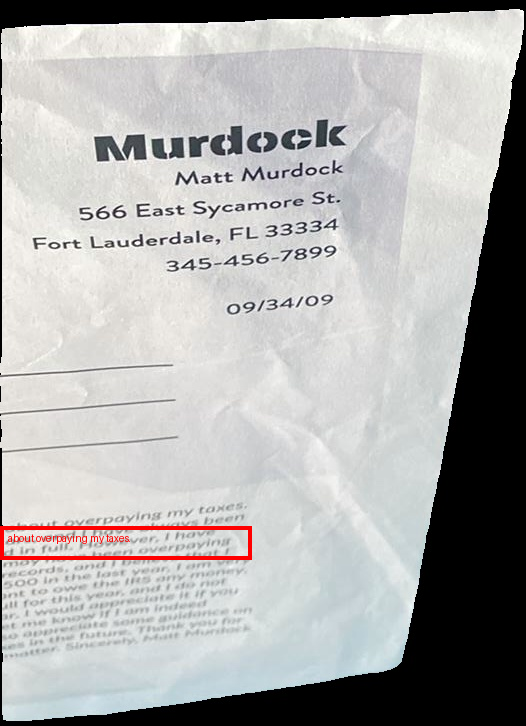

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "about overpaying my taxes."
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
100.0
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'and I have always been' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [104, 539, 282, 567], "label": "and I have always been"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [104, 539, 282, 567], 'label': 'and I have always been'}]


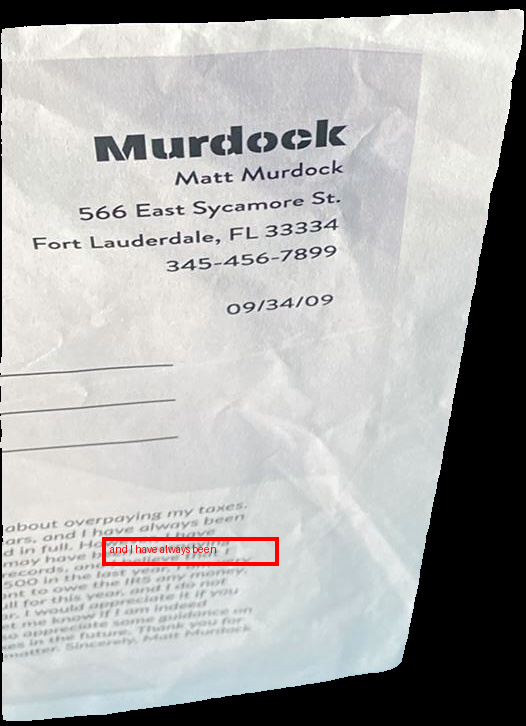

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "and I have always been"
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
100.0
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'd in full. However, I have' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [0, 531, 14, 540], "label": "'d in full. However, I have"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [0, 531, 14, 540], 'label': "'d in full. However, I have"}]


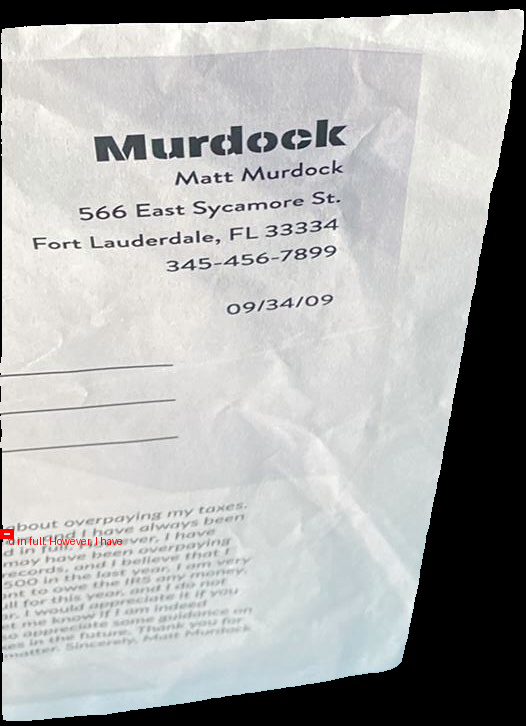

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "Murdock\nMatt Murdock\n566 East Sycamore St.\nFort Lauderdale, FL 33334\n345-456-7899\n09/34/09"
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
31.896551724137932
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'move have been overpaying' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [108, 537, 249, 562], "label": "move have been overpaying"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [108, 537, 249, 562], 'label': 'move have been overpaying'}]


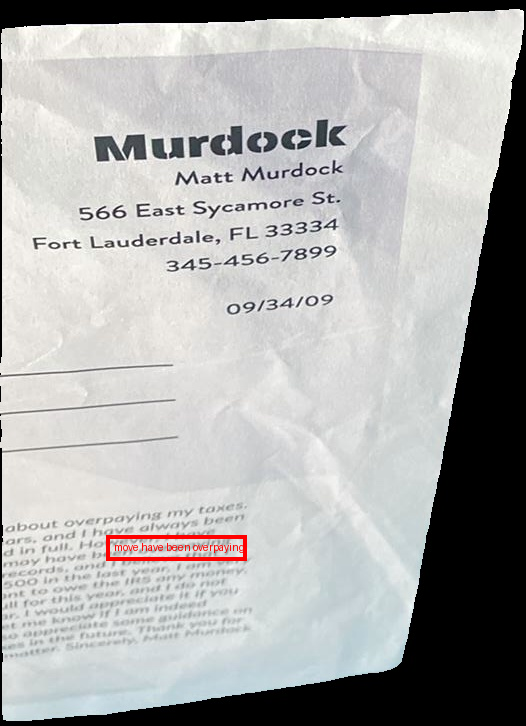

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "I move have been overpaying"
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
96.15384615384616
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'records, and I believe that I' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [184, 396, 275, 409], "label": "'records, and I believe that I'"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [184, 396, 275, 409], 'label': "'records, and I believe that I'"}]


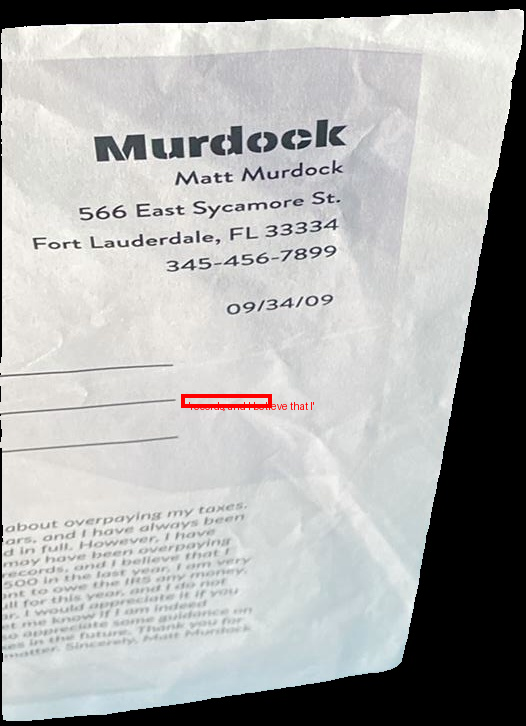

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "I realize and I believe that I"
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
86.4406779661017
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is '000 in the last year. I am very' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [198, 304, 337, 325], "label": "'000 in the last year. I am very"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [198, 304, 337, 325], 'label': "'000 in the last year. I am very"}]


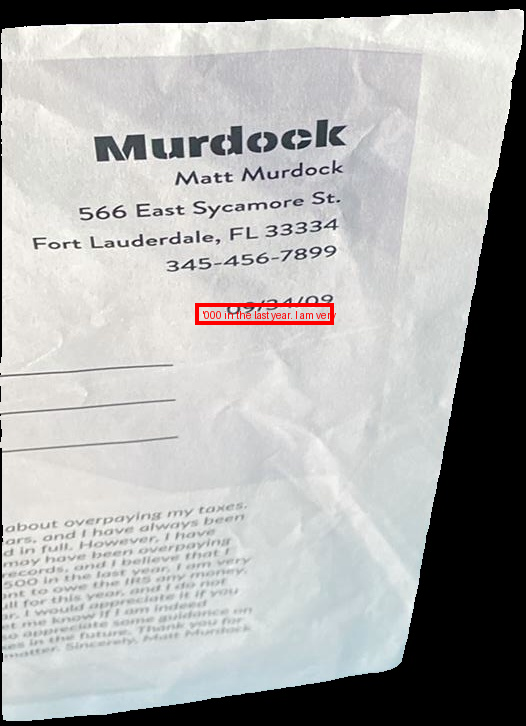

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "100 in the last year. I am very"
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
98.38709677419355
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'ant to owe the IRS any money,' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [0, 531, 254, 568], "label": "ant to owe the IRS any money,"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [0, 531, 254, 568], 'label': 'ant to owe the IRS any money,'}]


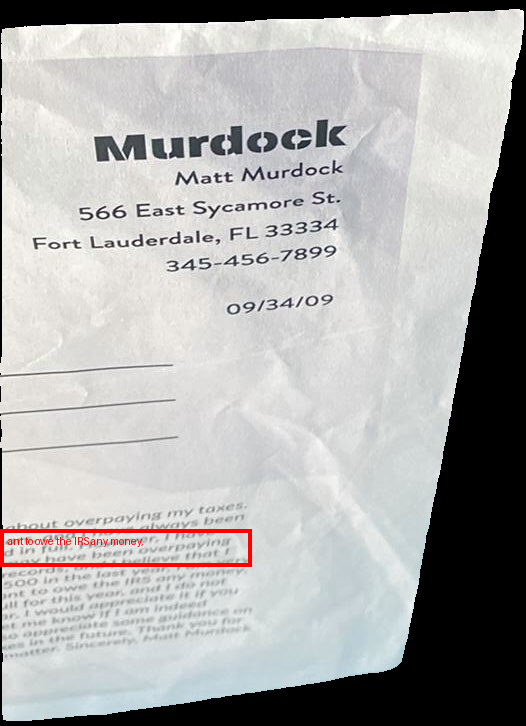

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "ant to owe the IRS any money."
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
98.27586206896551
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'll for this year, and I do not' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [198, 376, 245, 390], "label": "'ll for this year, and I do not"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [198, 376, 245, 390], 'label': "'ll for this year, and I do not"}]


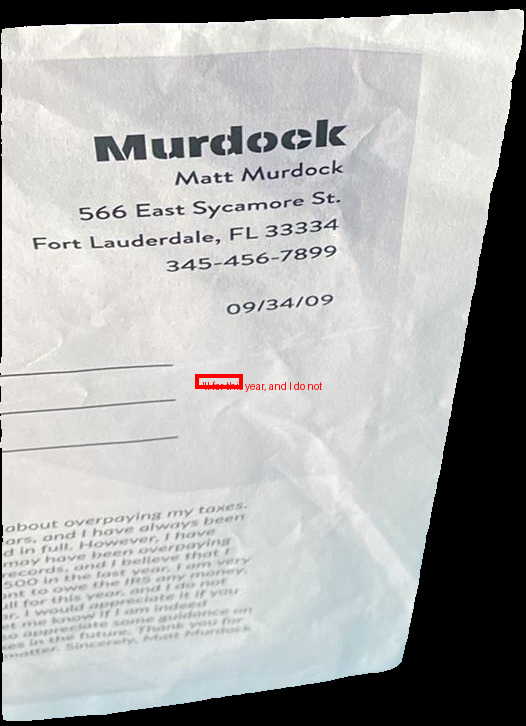

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "I expect to owe the IRS this year, and I do not"
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
72.72727272727273
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 't me know if I am indeed' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [104, 573, 256, 608], "label": "'t me know if I am indeed"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [104, 573, 256, 608], 'label': "'t me know if I am indeed"}]


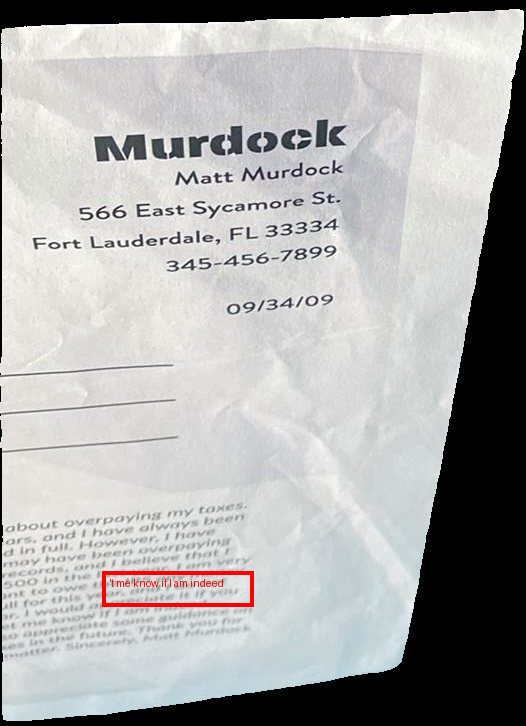

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "let me know if I am indeed"
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
96.0
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'so appreciate some guidance on' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [0, 578, 149, 603], "label": "where is'so appreciate some guidance on'"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [0, 578, 149, 603], 'label': "where is'so appreciate some guidance on'"}]


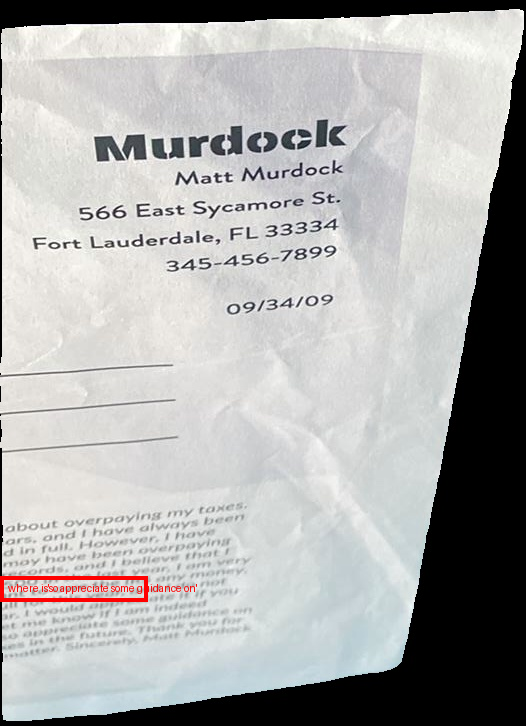

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "Where is also appreciate some guidance on"
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
84.50704225352112
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'es in the future. Thank you for' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [109, 623, 145, 637], "label": "'es in the future. Thank you for"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [109, 623, 145, 637], 'label': "'es in the future. Thank you for"}]


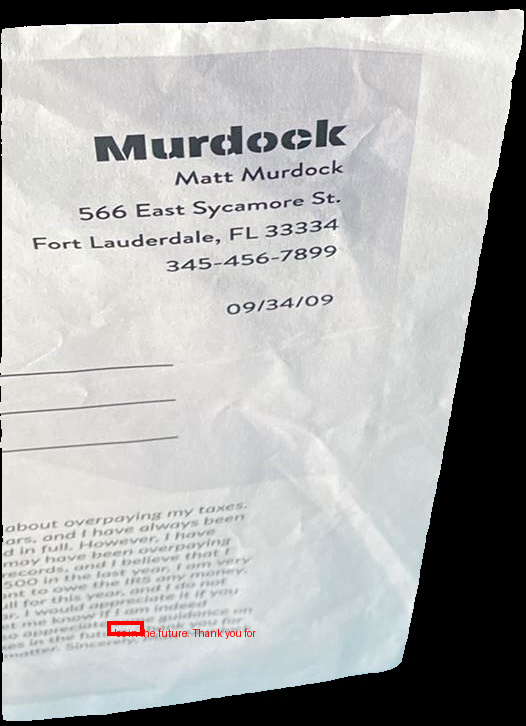

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "Murdock\nMatt Murdock\n566 East Sycamore St.\nFort Lauderdale, FL 33334\n345-456-7899\n09/34/09"
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
33.88429752066116
input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'matter. Sincerely, Matt Murdock' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [198, 617, 305, 640], "label": "'matter. Sincerely, Matt Murdock'"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [198, 617, 305, 640], 'label': "'matter. Sincerely, Matt Murdock'"}]


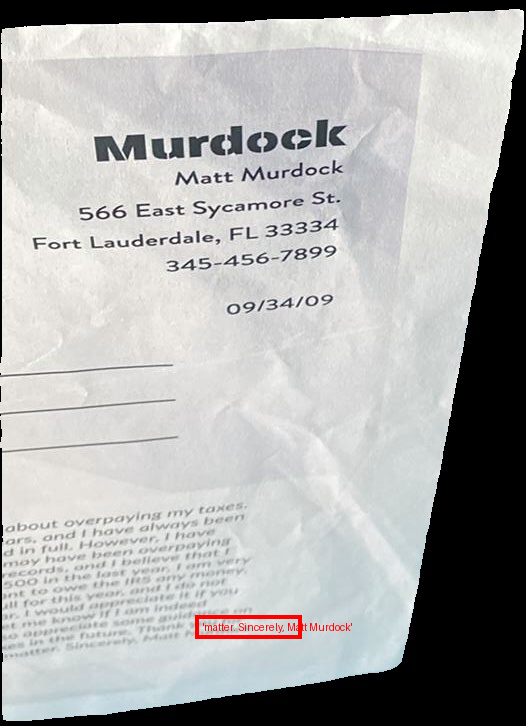

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Describe the text on the red bounding box, in JSON format<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
{
  "text": "matter. Sincerely, Matt Murdock"
}
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
100.0
(526, 726)
[{'bbox_2d': [91, 116, 350, 174], 'label': 'Murdock'}, {'bbox_2d': [176, 130, 348, 159], 'label': 'Matt Murdock'}, {'bbox_2d': [78, 169, 320, 224], 'label': "'566 East Sycamore St.'"}, {'bbox_2d': [167, 230, 342, 275], 'label': "'345-456-7899'"}, {'bbox_2d': [228, 291, 337, 316], 'label': "'09/34/09'"}, {'bbox_2d': [0, 528, 254, 561], 'label': 'about overpaying my taxes.'}, {'bbox_2d': [104, 539, 282, 567], 'label': 'and I have always been'}, {'bbox_2d': [108, 537, 249, 562], 'label': 'move have been overpaying'}, {'bbox_2d': [184, 396, 275, 409], 'label': "'records, and I believe that I'"}, {'bbox_2d': [198, 304, 337, 325], 'label'

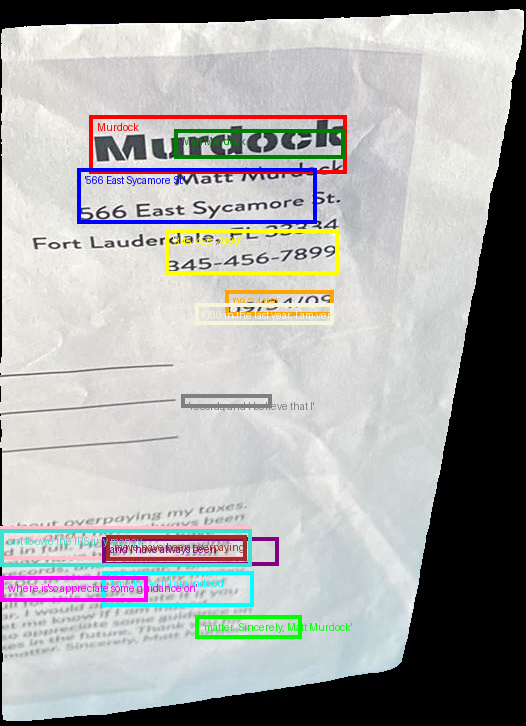

In [11]:
#!pip install opencv-python


directory = "/gpfs/projects/CascanteBonillaGroup/jmurrugarral/DeepSeek-VL2"
filename = 'masked_image.jpg'
image_file = 'masked_image.jpg'

#filename = 'image_ocr6.jpg'
#image_file = 'image_ocr6.jpg'

img_full_path = os.path.join(directory, filename)

get_pseudo_detections2(image_file, img_full_path, 80.0)

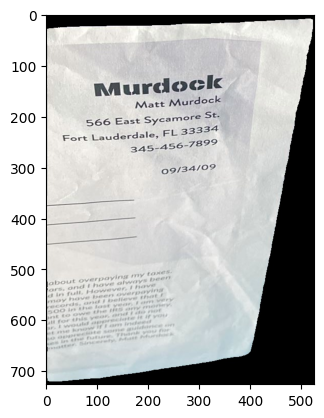

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'Murdock' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [91, 116, 350, 174], "label": "Murdock"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [91, 116, 350, 174], 'label': 'Murdock'}]


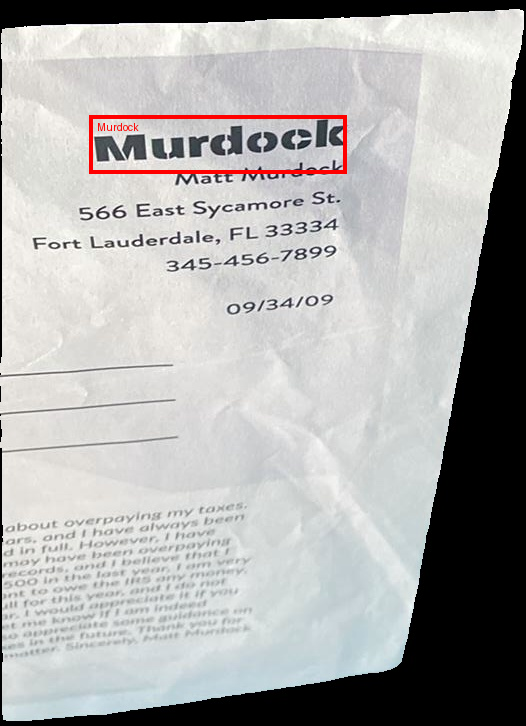

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'Matt Murdock' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [176, 130, 348, 159], "label": "Matt Murdock"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [176, 130, 348, 159], 'label': 'Matt Murdock'}]


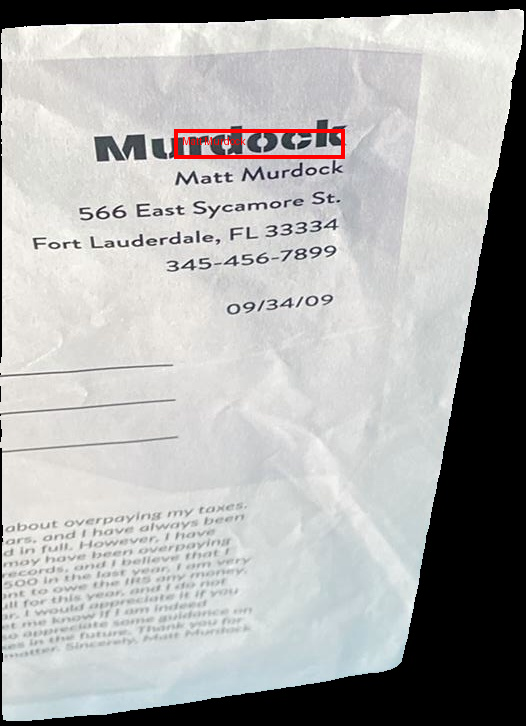

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is '566 East Sycamore St.' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [78, 169, 320, 224], "label": "'566 East Sycamore St.'"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [78, 169, 320, 224], 'label': "'566 East Sycamore St.'"}]


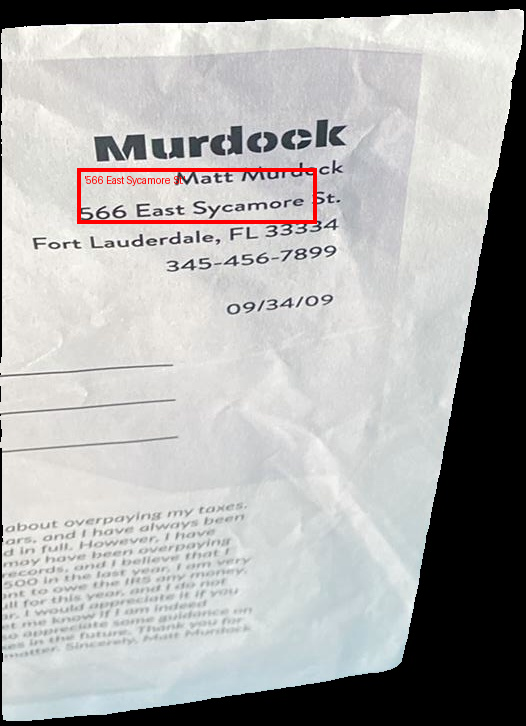

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'Fort Lauderdale, FL 32234' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [58, 229, 310, 256], "label": "'Fort Lauderdale, FL 32234'"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [58, 229, 310, 256], 'label': "'Fort Lauderdale, FL 32234'"}]


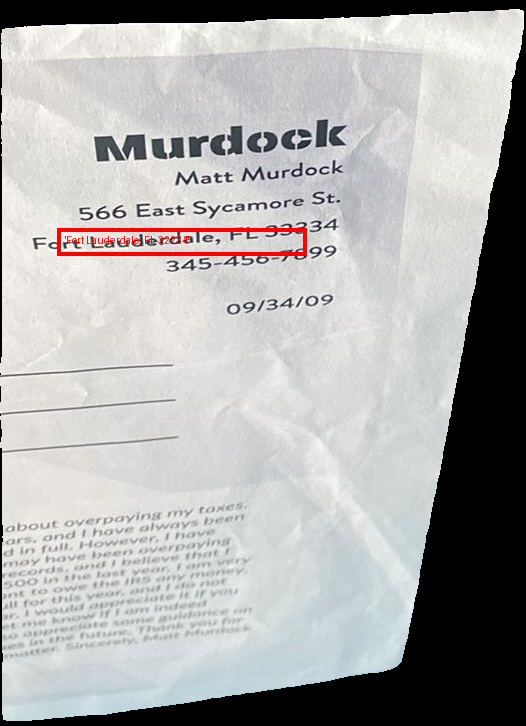

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is '345-456-7899' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [167, 230, 342, 275], "label": "'345-456-7899'"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [167, 230, 342, 275], 'label': "'345-456-7899'"}]


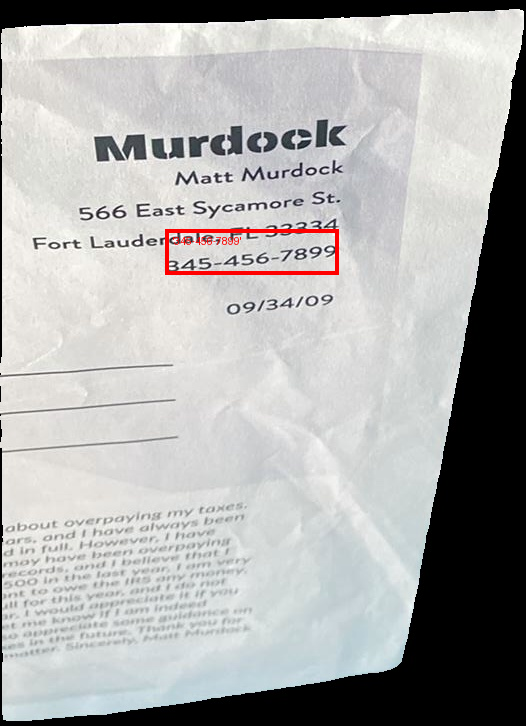

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is '09/34/09' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [228, 291, 337, 316], "label": "'09/34/09'"}
]
```
tensor(728, device='cuda:0')
tensor(532, device='cuda:0')
(526, 726)
[{'bbox_2d': [228, 291, 337, 316], 'label': "'09/34/09'"}]


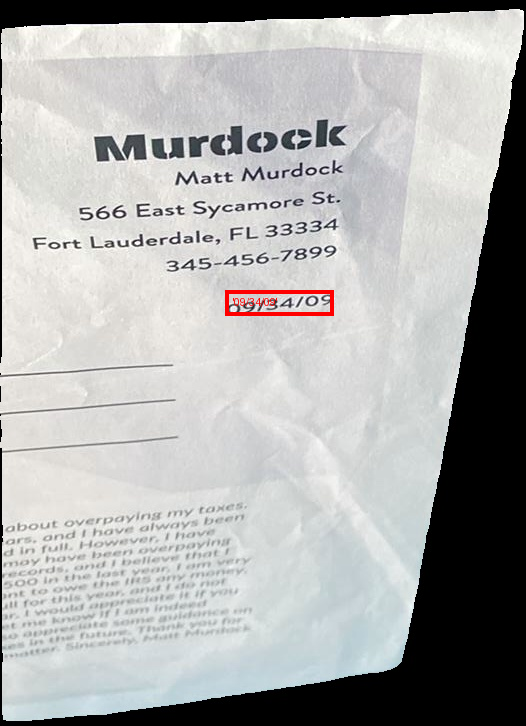

input:
 <|im_start|>system
You are a helpful assistant<|im_end|>
<|im_start|>user
Locate where is 'about overpaying my taxes, ars, and I have always beend in full. However, I havemay have been overpayingrecords, a I tell themselves that I 500 in the last year, I money. In the the IHS and do not int to this year, I state it if you will for would confirm an indeed or. I know if I am in needed to improve the future. Thank you how to give the future, Thank you know enter the future, Thank you know' on the image, output the bbo coordinates in JSON format.<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

output:
 ```json
[
	{"bbox_2d": [0, 523, 256, 541], "label": "where is 'about overpaying my taxes, ars, and I have always beend in full. However, I havemay have been overpayingrecords, a I tell themselves that I 500 in the last year, I money. In the the IHS and do not int to this year, I state it if you will for would confirm an indeed or. I know if I am in needed 

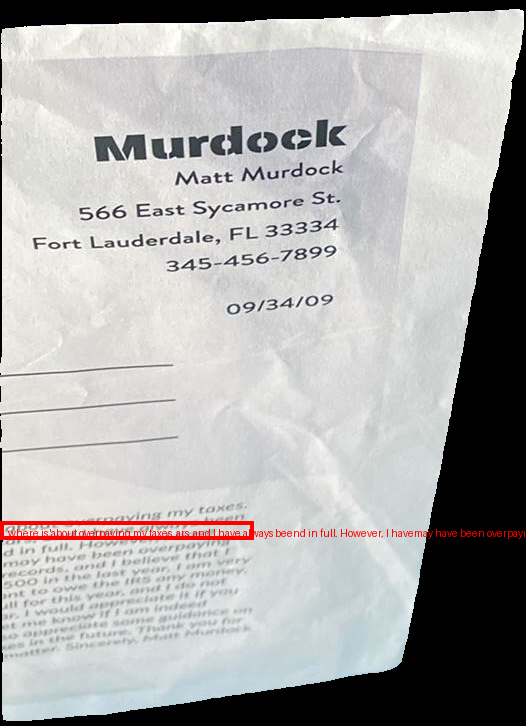

('```json\n[\n\t{"bbox_2d": [0, 523, 256, 541], "label": "where is \'about overpaying my taxes, ars, and I have always beend in full. However, I havemay have been overpayingrecords, a I tell themselves that I 500 in the last year, I money. In the the IHS and do not int to this year, I state it if you will for would confirm an indeed or. I know if I am in needed to improve the future. Thank you how to give the future, Thank you know enter the future, Thank you know\' on the image"}\n]\n```',
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=526x726>)

In [12]:
directory = "/gpfs/projects/CascanteBonillaGroup/jmurrugarral/DeepSeek-VL2"
filename = 'masked_image.jpg'
image_file = 'masked_image.jpg'

img_full_path = os.path.join(directory, filename)

import matplotlib.pyplot as plt
import PIL

pil_img = PIL.Image.open(img_full_path)
pil_img = pil_img.convert("RGB")

plt.imshow(pil_img)
plt.show()

img_full_path

locate_private_content(img_full_path, "Locate where is 'Murdock' on the image, output the bbo coordinates in JSON format.", temperature = 1, top_p = 0.8)
locate_private_content(img_full_path, "Locate where is 'Matt Murdock' on the image, output the bbo coordinates in JSON format.", temperature = 1, top_p = 0.8)
locate_private_content(img_full_path, "Locate where is '566 East Sycamore St.' on the image, output the bbo coordinates in JSON format.", temperature = 1, top_p = 0.8)
locate_private_content(img_full_path, "Locate where is 'Fort Lauderdale, FL 32234' on the image, output the bbo coordinates in JSON format.", temperature = 1, top_p = 0.8)
locate_private_content(img_full_path, "Locate where is '345-456-7899' on the image, output the bbo coordinates in JSON format.", temperature = 1, top_p = 0.8)
locate_private_content(img_full_path, "Locate where is '09/34/09' on the image, output the bbo coordinates in JSON format.", temperature = 1, top_p = 0.8)
locate_private_content(img_full_path, "Locate where is 'about overpaying my taxes, ars, and I have always beend in full. However, I havemay have been overpayingrecords, a I tell themselves that I 500 in the last year, I money. In the the IHS and do not int to this year, I state it if you will for would confirm an indeed or. I know if I am in needed to improve the future. Thank you how to give the future, Thank you know enter the future, Thank you know' on the image, output the bbo coordinates in JSON format.", temperature = 1, top_p = 0.8)